In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df=pd.read_csv("data/MLF_GP1_CreditScore.csv")

In [3]:
cols=list(df.columns.values)
cols

['Sales/Revenues',
 'Gross Margin',
 'EBITDA',
 'EBITDA Margin',
 'Net Income Before Extras',
 'Total Debt',
 'Net Debt',
 'LT Debt',
 'ST Debt',
 'Cash',
 'Free Cash Flow',
 'Total Debt/EBITDA',
 'Net Debt/EBITDA',
 'Total MV',
 'Total Debt/MV',
 'Net Debt/MV',
 'CFO/Debt',
 'CFO',
 'Interest Coverage',
 'Total Liquidity',
 'Current Liquidity',
 'Current Liabilities',
 'EPS Before Extras',
 'PE',
 'ROA',
 'ROE',
 'InvGrd',
 'Rating']

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1700 entries, 0 to 1699
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Sales/Revenues            1700 non-null   float64
 1   Gross Margin              1700 non-null   float64
 2   EBITDA                    1700 non-null   float64
 3   EBITDA Margin             1700 non-null   float64
 4   Net Income Before Extras  1700 non-null   float64
 5   Total Debt                1700 non-null   float64
 6   Net Debt                  1700 non-null   float64
 7   LT Debt                   1700 non-null   float64
 8   ST Debt                   1700 non-null   float64
 9   Cash                      1700 non-null   float64
 10  Free Cash Flow            1700 non-null   float64
 11  Total Debt/EBITDA         1700 non-null   float64
 12  Net Debt/EBITDA           1700 non-null   float64
 13  Total MV                  1700 non-null   float64
 14  Total De

In [5]:
df.describe()

,Sales/Revenues,Gross Margin,EBITDA,EBITDA Margin,Net Income Before Extras,Total Debt,Net Debt,LT Debt,ST Debt,Cash,...,CFO,Interest Coverage,Total Liquidity,Current Liquidity,Current Liabilities,EPS Before Extras,PE,ROA,ROE,InvGrd
count,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,...,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000
mean,0.050378,0.026007,0.068718,0.021074,0.123026,0.822405,-0.419810,1.255168,3.142797,0.466620,...,-0.189317,0.298785,-0.855714,0.436002,0.072802,0.032196,0.497705,0.019394,-0.217604,0.757059
std,0.161910,0.273768,0.237365,0.189025,14.475689,13.317075,28.385702,16.224453,51.986550,1.859494,...,5.668669,5.265291,22.926862,1.904282,0.266471,6.151994,12.102502,14.594193,15.389000,0.428986
min,-0.661715,-0.794722,-0.782254,-0.805153,-289.000000,-0.903014,-493.305578,-0.921515,-0.997692,-0.990982,...,-161.609425,-0.991976,-502.000000,-0.994141,-0.684678,-96.250000,-59.795133,-305.462167,-373.837267,0.000000
25%,-0.005693,-0.020028,-0.022640,-0.042771,-0.158478,-0.076316,-0.120725,-0.094767,-0.337959,-0.195117,...,-0.115159,-0.096996,-0.857013,-0.227327,-0.072734,-0.152894,-0.293521,-0.208483,-0.233955,1.000000
50%,0.034000,0.003403,0.049482,0.011134,0.056627,0.005886,-0.003060,-0.002078,0.043092,0.075820,...,0.046983,0.043216,-0.229098,0.040446,0.041785,0.066027,-0.040405,-0.009403,-0.020392,1.000000
75%,0.083004,0.025595,0.124533,0.060566,0.222219,0.136449,0.160251,0.174735,0.649475,0.483113,...,0.216432,0.177340,0.512778,0.416067,0.161215,0.236046,0.168897,0.156136,0.201596,1.000000
max,2.277229,3.202713,3.542425,4.141182,478.280075,281.604237,865.194595,289.388178,2038.000000,36.980037,...,13.005788,182.131887,280.138728,34.372455,4.194381,187.000000,381.243282,474.847172,343.145356,1.000000


In [6]:
df.head(10)

,Sales/Revenues,Gross Margin,EBITDA,EBITDA Margin,Net Income Before Extras,Total Debt,Net Debt,LT Debt,ST Debt,Cash,...,Interest Coverage,Total Liquidity,Current Liquidity,Current Liabilities,EPS Before Extras,PE,ROA,ROE,InvGrd,Rating
0,-0.005496,0.030763,0.018885,0.024515,0.146849,-0.029710,-0.019296,-0.042648,0.049875,-0.133716,...,0.136748,0.392143,-0.184887,0.062781,0.148305,0.100409,0.163266,0.102521,1,A1
1,-0.005496,0.030763,0.088716,0.094733,0.146849,-0.029710,-0.019296,-0.042648,0.049875,-0.133716,...,0.214657,0.392143,-0.184887,0.062781,0.148305,-0.089598,0.163266,0.102521,1,A1
2,-0.007045,0.023159,0.088716,0.096440,0.108590,0.039410,0.034268,0.009059,0.250371,0.101315,...,0.205290,0.483257,-0.017877,0.121357,0.110656,-0.045142,0.105711,0.103378,1,A1
3,-0.009396,0.028400,0.088716,0.099046,0.146137,0.030071,0.036938,-0.016964,0.356994,-0.052606,...,0.232991,0.996955,-0.122017,0.079051,0.151639,-0.008231,0.162421,0.132295,1,A1
4,-0.009009,0.027714,0.088716,0.098611,0.123500,0.024224,0.034445,-0.034132,0.461894,-0.090869,...,0.172906,1.711426,-0.161561,0.084319,0.130435,0.015528,0.156427,0.225144,1,A1
5,-0.000975,0.028962,0.088716,0.089782,0.115293,0.044688,0.029130,-0.145020,2.069438,0.237230,...,0.113915,14.629626,-0.011534,0.251670,0.125954,0.317581,0.154518,0.233034,1,A1
6,0.007962,0.027144,0.088716,0.080115,0.109771,0.009596,-0.007628,-0.073851,0.477672,0.204333,...,0.066788,0.794767,0.120643,0.074683,0.121771,0.142614,0.134685,0.244263,1,A1
7,0.007962,0.027144,0.099030,0.090350,0.109771,0.009596,-0.007628,-0.073851,0.477672,0.204333,...,0.076895,0.794767,0.120643,0.074683,0.121771,0.096257,0.134685,0.244263,1,A1
8,0.013933,0.033939,0.099030,0.083930,0.141935,0.002516,-0.000821,-0.050053,0.297387,0.040248,...,0.083493,0.595690,0.005384,0.034679,0.158672,0.057714,0.170059,0.233218,1,A1
9,0.016340,0.028670,0.099030,0.081359,0.104525,0.011605,-0.003394,-0.024907,0.195448,0.209254,...,0.059150,0.185214,0.124636,0.075246,0.117438,-0.001900,0.112976,0.201724,1,A1


In [7]:
df.InvGrd.value_counts()

1    1287
0     413
Name: InvGrd, dtype: int64

In [8]:
df.Rating.value_counts()

Baa2    326
Baa3    232
Baa1    179
Aa3     174
A2      156
Ba2     125
A1      122
Ba3     108
B1       69
Aa2      65
B2       48
B3       37
A3       31
Ba1      17
Caa1      9
Aaa       2
Name: Rating, dtype: int64

Ratings that are investment grade 

In [9]:
df.query('InvGrd == 1')['Rating'].value_counts()

Baa2    326
Baa3    232
Baa1    179
Aa3     174
A2      156
A1      122
Aa2      65
A3       31
Aaa       2
Name: Rating, dtype: int64

Ratings that are investment grade 

In [10]:
df.query('InvGrd == 0')['Rating'].value_counts()

Ba2     125
Ba3     108
B1       69
B2       48
B3       37
Ba1      17
Caa1      9
Name: Rating, dtype: int64

/Users/samanvayms/opt/anaconda3/lib/python3.9/site-packages/pandas/plotting/_matplotlib/tools.py:228: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(**fig_kw)


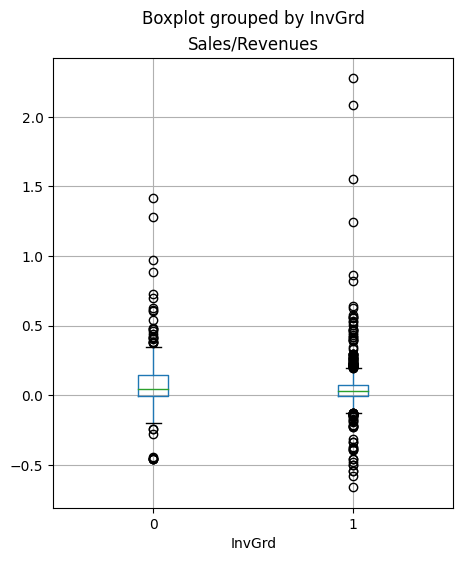

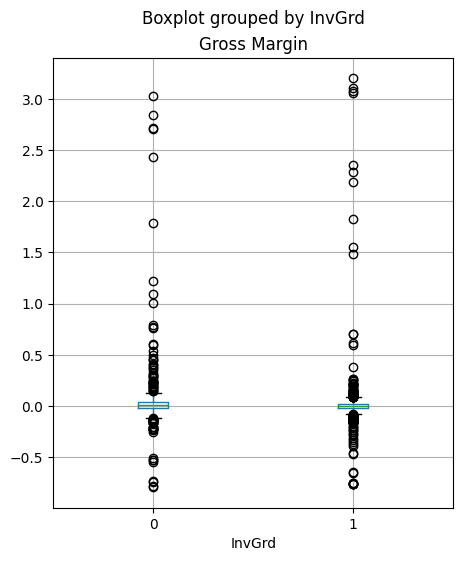

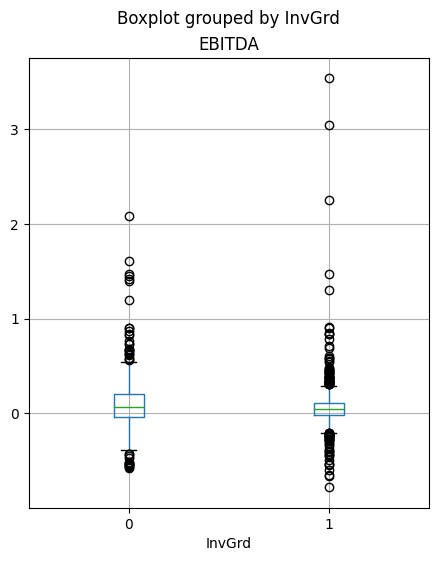

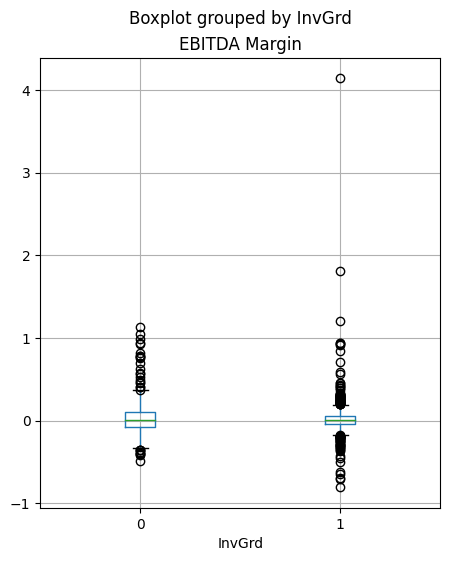

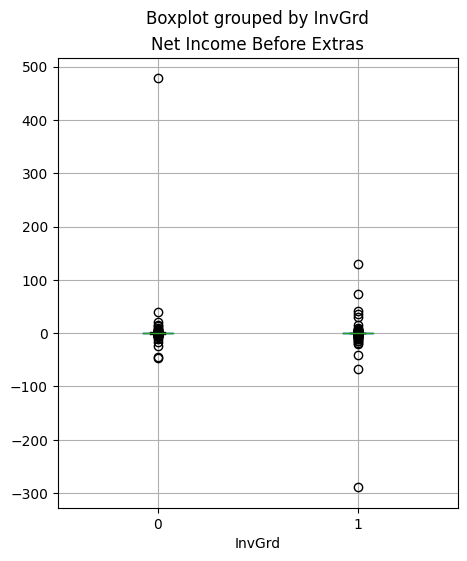

...

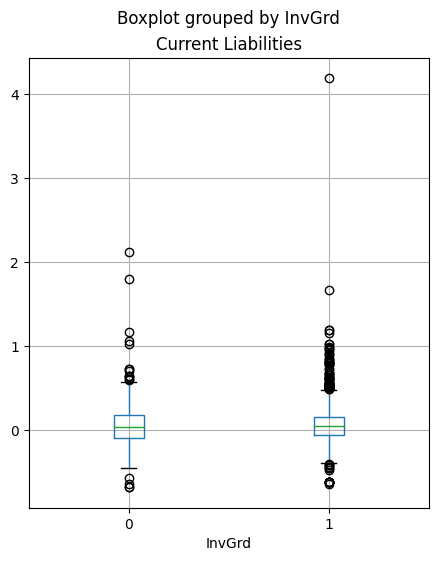

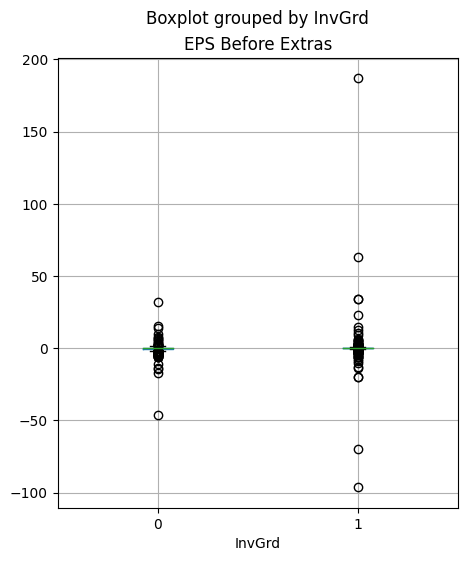

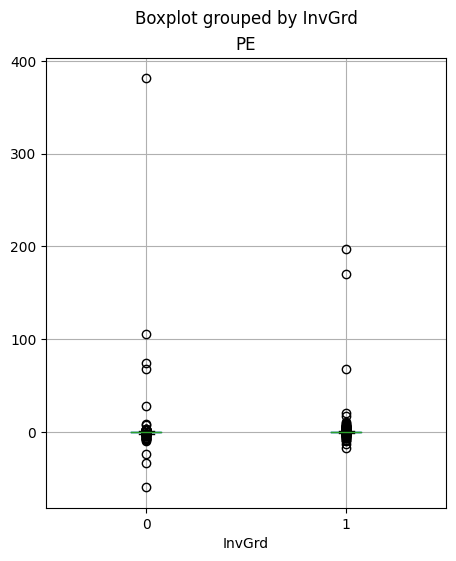

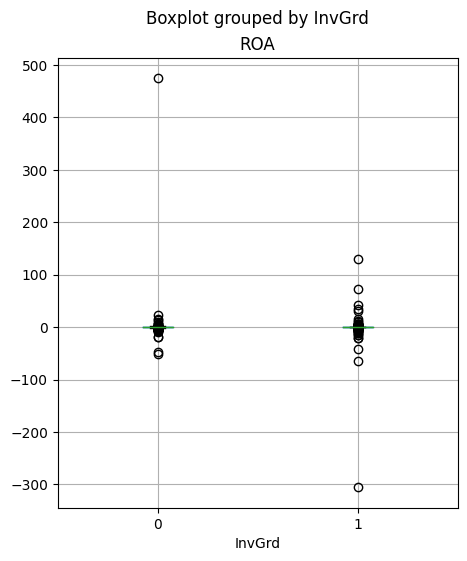

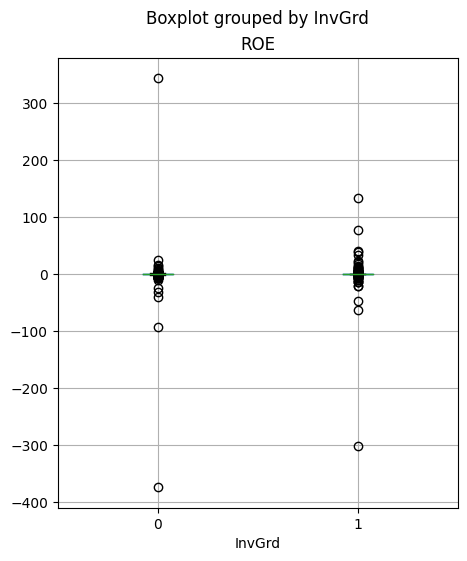

In [11]:
for col in cols[:-1]:
    df.boxplot(column=col, by='InvGrd', figsize=(5,6))
plt.close()

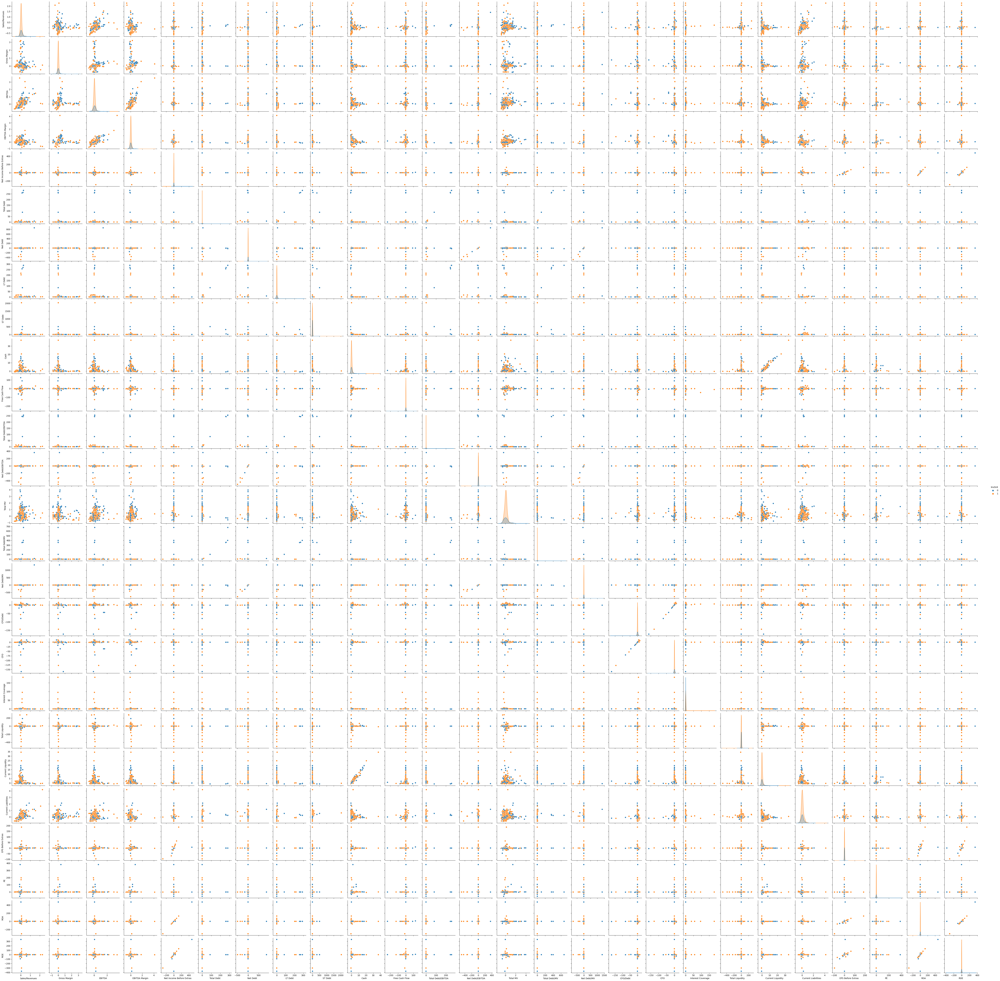

In [12]:
sns.pairplot(df, hue='InvGrd')

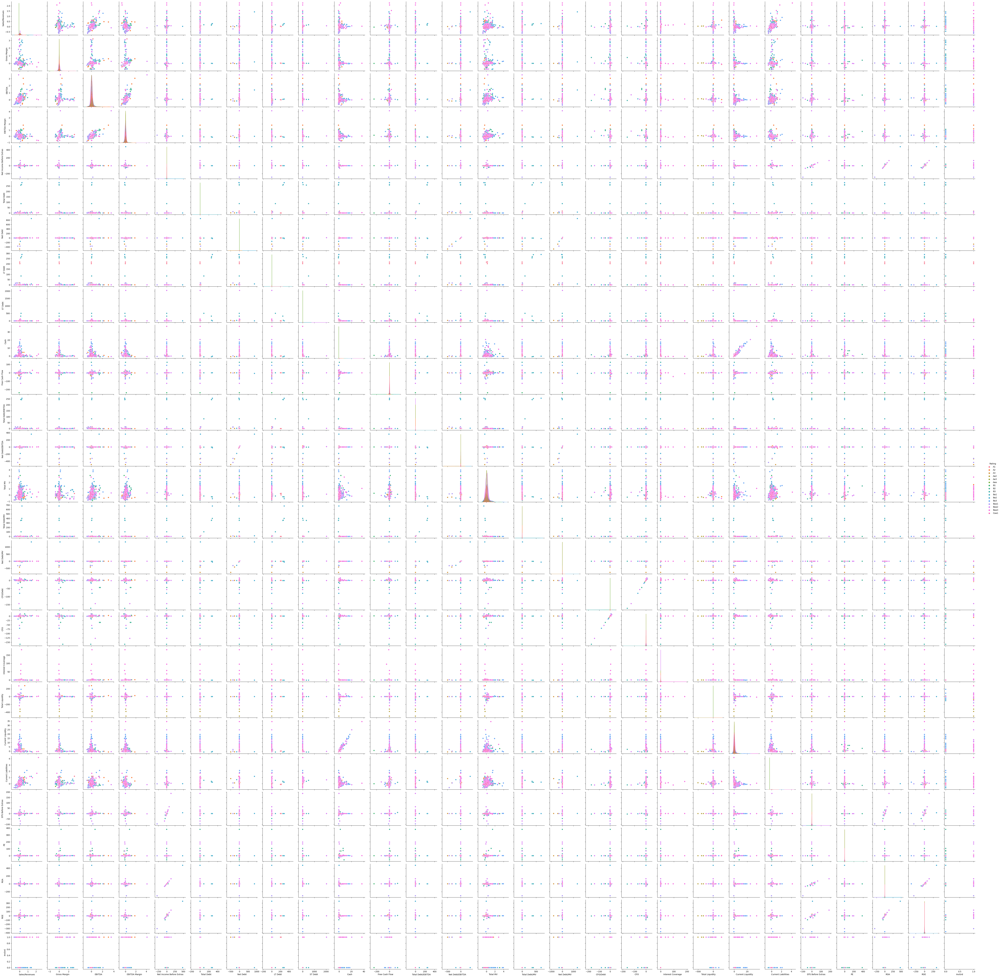

In [13]:
sns.pairplot(df, hue='Rating')

let's get rid of the Rating column as it's not required 

In [14]:
test=df.drop(['Rating'],axis=1)

In [15]:
X=test.drop(['InvGrd'],axis=1)
y=test.InvGrd

In [16]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.model_selection import train_test_split ,GridSearchCV, StratifiedKFold, cross_validate, cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier

In [17]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.1, random_state=42,stratify=y)

# We are going to isolate the test data and only use it when we're testing our final chosen model at the end.

In [18]:
steps=[('scaler',StandardScaler()),('lda',LinearDiscriminantAnalysis())]
pipeline=Pipeline(steps)

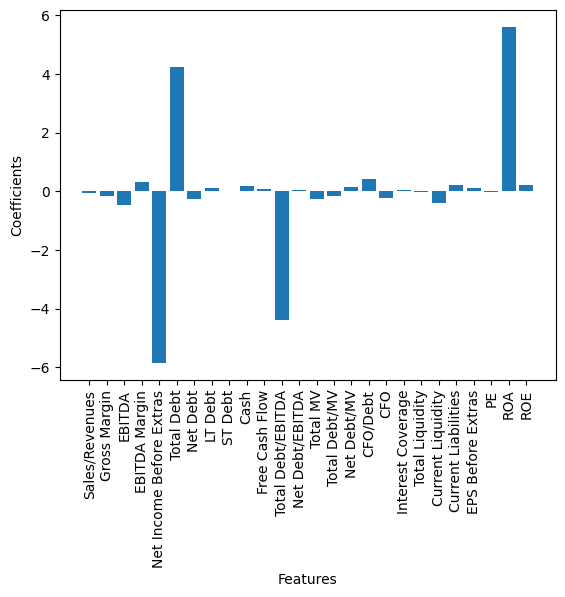

In [19]:
pipeline.fit(X_train, y_train)

coefficients = pipeline.named_steps['lda'].coef_

# Plot the coefficients
plt.bar(range(X.shape[1]), coefficients[0])
plt.xticks(range(X.shape[1]), X_train.columns, rotation=90)
plt.xlabel('Features')
plt.ylabel('Coefficients')
plt.show()

Here we get the coefficients that have the most influence on the classification 
we see 4 factors having a huge influence and we take these to decrease dimensionality

In [20]:
top_features = np.argsort(coefficients[0])[::-1][:4]
X_train.columns[top_features]

Index(['ROA', 'Total Debt', 'CFO/Debt', 'EBITDA Margin'], dtype='object')

In [21]:
X_train_lda = X_train.iloc[:, top_features] * coefficients[:, top_features]
X_test_lda = X_test.iloc[:, top_features] * coefficients[:, top_features]

logreg=LogisticRegression()
logreg1=LogisticRegression(solver='liblinear') # since the default lbfgs solver failed to converge 

In [22]:
scoresLDA = cross_validate(logreg, X_train_lda, y_train, cv=5, return_train_score=True)
scores_without_LDA = cross_validate(logreg1, X_train, y_train, cv=5, return_train_score=True)

In [23]:
scoresLDA['test_score'].mean()

0.7607843137254902

In [24]:
scoresLDA['test_score'].std()

0.00633683641492332

In [25]:
scores_without_LDA['test_score'].mean()

0.761437908496732

In [26]:
scores_without_LDA['test_score'].std()

0.00800486844046791

 we get similar accuracy but with less dimensionality and CV scores seem to be closer together 

let's use a random forest to classify the data and get feature importances

In [27]:
parameters={'n_estimators':(100,200,300,400,500)}
forest= RandomForestClassifier(oob_score=True)
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
model = GridSearchCV(forest,parameters,cv=kf)

In [28]:
model.fit(X_train,y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=True),
             estimator=RandomForestClassifier(oob_score=True),
             param_grid={'n_estimators': (100, 200, 300, 400, 500)})

In [86]:
best_forest=model.best_estimator_

In [87]:
best_forest.oob_score_

0.8771241830065359

In [31]:
model.best_params_

{'n_estimators': 400}

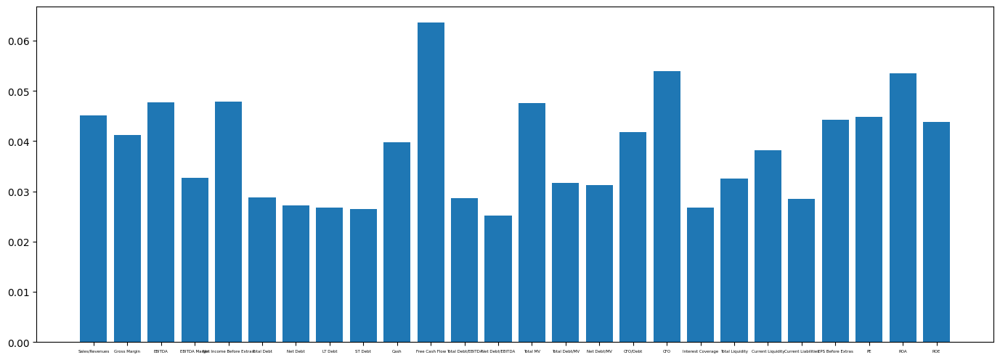

In [32]:
fig, ax = plt.subplots(figsize=(17, 6))
ax.bar(X_train.columns,best_model.feature_importances_)
ax.tick_params(axis='x', labelsize=4)
plt.show()

In [97]:
scores_forest = cross_validate(best_forest, X_train, y_train, cv=5, return_train_score=True)

In [98]:
scores_forest['test_score'].mean()

0.8705882352941176

In [99]:
scores_forest['test_score'].std()

0.017243014324539785

In [100]:
scores_forest['train_score'].mean()

1.0

In [101]:
scores_forest['train_score'].std()

0.0

weirdly unlike in LDA all the features are being branded as important

let's use adaptive boost with a stump as the model and check the accuracy.

In [33]:
parameters_stump={'n_estimators':(200,300,400,500,600)}
clf=DecisionTreeClassifier(max_depth=2)
adaboost=AdaBoostClassifier(clf,learning_rate=0.1,random_state=42)
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
adamodel = GridSearchCV(adaboost,parameters_stump,cv=kf)

In [34]:
adamodel.fit(X_train,y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=True),
             estimator=AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=2),
                                          learning_rate=0.1, random_state=42),
             param_grid={'n_estimators': (200, 300, 400, 500, 600)})

In [35]:
adamodel.best_params_

{'n_estimators': 400}

In [36]:
best_boosting=adamodel.best_estimator_

In [37]:
best_boosting.score(X_train,y_train)

0.9738562091503268

In [102]:
scores_boost = cross_validate(best_boosting, X_train, y_train, cv=5, return_train_score=True)

In [103]:
scores_boost['test_score'].mean()

0.8437908496732026

In [104]:
scores_boost['test_score'].std()

0.01954237436304062

In [105]:
scores_boost['train_score'].mean()

0.986111111111111

In [106]:
scores_boost['train_score'].std()

0.0014614823382351515

# Next we run the same with a Multi Layer Perceptron (deep neural network) Classifier of different depths.

In [71]:
parameters_NN={'activation':('logistic', 'tanh', 'relu'),'hidden_layer_sizes':((10,1),(10,2),(10,3),(10,4),(10,5),(10,6))}
NN = MLPClassifier(learning_rate_init=0.01, learning_rate='adaptive',max_iter=1000, random_state=42, early_stopping=True)
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
NNmodel= GridSearchCV(NN,parameters_NN,cv=kf)

In [72]:
NNmodel.fit(X_train,y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=True),
             estimator=MLPClassifier(early_stopping=True,
                                     learning_rate='adaptive',
                                     learning_rate_init=0.01, max_iter=1000,
                                     random_state=42),
             param_grid={'activation': ('logistic', 'tanh', 'relu'),
                         'hidden_layer_sizes': ((10, 1), (10, 2), (10, 3),
                                                (10, 4), (10, 5), (10, 6))})

In [73]:
NNmodel.best_params_

{'activation': 'tanh', 'hidden_layer_sizes': (10, 2)}

In [74]:
best_NN=NNmodel.best_estimator_

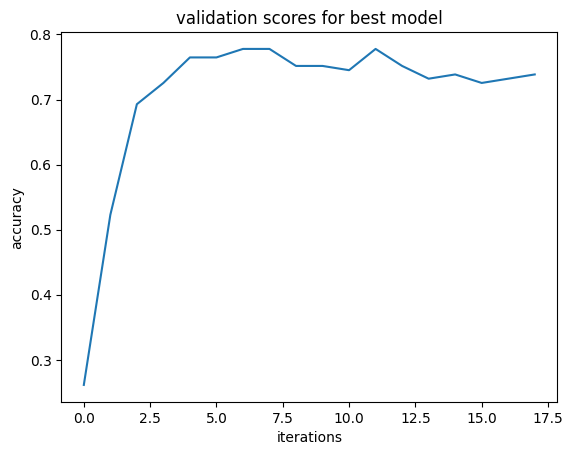

In [77]:
plt.plot(best_NN.validation_scores_)
plt.title('validation scores for best model')
plt.xlabel("iterations")
plt.ylabel("accuracy")
plt.show()

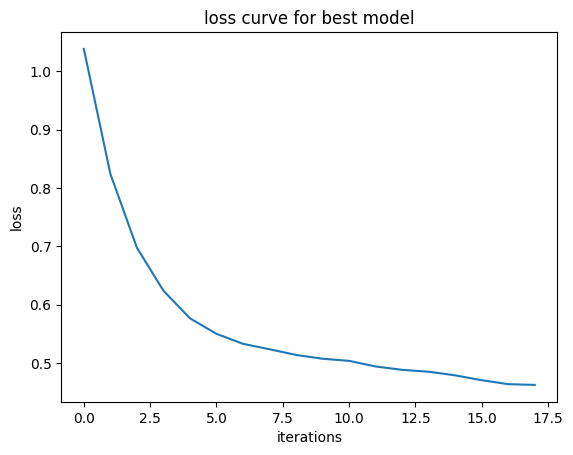

In [78]:
plt.plot(best_NN.loss_curve_)
plt.title('loss curve for best model')
plt.xlabel("iterations")
plt.ylabel("loss")
plt.show()

### We see that the tuned random forest is the model that has the best score on the test score compared to the logistic regression, adaboost stumps and the neural network so let's now run all of them on our untouched dataset and see which one performs the best and if our choice of random forest was the right one

### Logistic Regression with and without LDA

In [81]:
logreg1.fit(X_train,y_train)
y_pred_logreg1 = logreg1.predict(X_test)
logreg1_score = accuracy_score(y_pred_logreg1,y_test)
logreg.fit(X_train_lda,y_train)
y_pred_logreg = logreg.predict(X_test_lda)
logreg_score = accuracy_score(y_pred_logreg,y_test)

In [84]:
logreg1_score # accuracy score without LDA 

0.7529411764705882

In [85]:
logreg_score # accuracy score with LDA

0.7588235294117647

### Best Random Forest( The Optimum classifier we found from our experiments)

In [91]:
y_pred_forest = best_forest.predict(X_test)
forest_score = accuracy_score(y_pred_forest,y_test)

In [92]:
forest_score

0.8176470588235294

### Best Adaptive boost model

In [94]:
y_pred_adaboost = best_boosting.predict(X_test)
adaboost_score = accuracy_score(y_pred_adaboost,y_test)

In [95]:
adaboost_score

0.8058823529411765

### Best MLP Classifier 

In [108]:
y_pred_MLPC = best_NN.predict(X_test)
MLPC_score = accuracy_score(y_pred_MLPC,y_test)

In [109]:
MLPC_score

0.7529411764705882

### Turns out our decision to choose the Random forest was right as the model though didn't perform as the validation scores during training did outperform the other models 